## Content

<ul>
    <li> Dataframes </li>
    <li> Visual </li>
</ul>

## Indroduction

This is the laub loomis model we are going to go through. We exploring the simulations of the laub loomis solved by the euler method. Then go through the predictions given. by the neural network

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import product
from scipy.integrate import odeint
import sys
sys.path.insert(1, '../../')
import prototype_nn as NN
import pandas as pd
import numpy as np

In [2]:
mu = 0.5

def laub(state, t):
    x, y, z, w, p, q, m = state
    func_1 = 1.4 * z - 0.9 * x
    func_2 = 2.5 * p - 1.5 * y
    func_3 = 0.6 * m - 0.8 * y * z
    func_4 = 2 - 1.3 * z * w
    func_5 = 0.7 * x - w * p
    func_6 = 0.3 * x - 3.1 * q
    func_7 = 1.8 * q - 1.5 * y * m
    return func_1, func_2, func_3, func_4, func_5, func_6, func_7


def states(x, y, z, w, p, q, m, t):
    """
        states:
            This will be used to implement the model -laub using the odeint
            method. It then returns the states belonging to the system
        Args:
            x (int): This is the x value
            y (int): This is the y value
            z (int): This is the z value
            w (int): This is the w value
            p (int): This is the p value
            q (int): This is the q value
        Returns
            (<class 'numpy.ndarray'>) : This is the data of the model.
    """
    state_0 = [x, y, z, w, p, q, m]
    states = odeint(laub, state_0, t)
    return states
    
def dataframe(x, y, z, w, p, q, m, t, init_x, init_y, init_z, init_w, init_p, init_q, init_m):
    """
        dataframe:
            This will produce the dataframe of the van der pol model
            showing the x, y state values including the time variable,
            initial x and y state values
        Args:
            x (int):
                The x value state to start from
            y (int): 
                The y value state to start from
            z (int):
                The z value state to start from
            w (int): 
                The w value state to start from
            p (int):
                The p value state to start from
            q (int): 
                The q value state to start from
            m (int): 
                The m value state to start from
            init_x (int) :
                The initial x state value
            init_y (int):
                The initial y state value
            init_z (int) :
                The initial z state value
            init_w (int):
                The initial w state value
            init_p (int):
                The initial p state value
            init_q (int):
                The initial q state value
            init_m (int):
                The initial m state value
        Return:
            (<class 'pandas.core.frame.DataFrame'>): The dataframe of the model
    """
    state = states(x, y, z, w, p, q, m, t)
    data = {'time' : t, 'x' : state[:, 0], 'y' : state[:, 1], 'z' : state[:, 2],
                'w' : state[:, 3], 'p' : state[:, 4], 'q' : state[:, 5], 'm' : state[:, 6]}
    df = pd.DataFrame(data=data)
    df['initial_x'] = init_x
    df['initial_y'] = init_y
    df['initial_z'] = init_z
    df['initial_w'] = init_w
    df['initial_p'] = init_q
    df['initial_q'] = init_p
    df['initial_m'] = init_m
    return df

## Dataframes

This is the data showing the simulations of the laub loomis system. 

In [3]:
t = np.arange(0,20.1,0.1)
ranges = range(3,5,1)
laub_df_test = []
for x, y, z, w, p, q, m in product(ranges, ranges, ranges, ranges, ranges, ranges, ranges):
        df = dataframe(x, y, z, w, p, q, m, t, x, y, z, w, p, q, m) # test for 3, 5
        laub_df_test.append(df)

In [4]:
len(laub_df_test)

128

In [5]:
laub_df_test[0]

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,3,3,3,3,3
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,3,3,3,3,3
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,3,3,3,3,3
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,3,3,3,3,3
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,3,3,3,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866270,0.327754,0.588248,2.797644,0.209066,0.082403,0.291280,3,3,3,3,3,3,3
197,19.7,0.870604,0.330891,0.590216,2.783869,0.211213,0.082843,0.291751,3,3,3,3,3,3,3
198,19.8,0.874817,0.334089,0.592010,2.770456,0.213350,0.083276,0.292142,3,3,3,3,3,3,3
199,19.9,0.878896,0.337336,0.593626,2.757446,0.215470,0.083701,0.292450,3,3,3,3,3,3,3


In [6]:
laub_df_test[1]

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,3,3,3,3,3,3,4
1,0.1,3.110575,3.213076,2.517265,2.265016,2.503904,2.279394,2.877002,3,3,3,3,3,3,4
2,0.2,3.148622,3.312587,2.065538,1.856290,2.240961,1.752712,2.043277,3,3,3,3,3,3,4
3,0.3,3.126730,3.351637,1.672234,1.635285,2.086498,1.366558,1.455968,3,3,3,3,3,3,4
4,0.4,3.058444,3.356245,1.343282,1.527465,1.983263,1.082113,1.050532,3,3,3,3,3,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.863509,0.325781,0.586975,2.806468,0.207710,0.082124,0.290968,3,3,3,3,3,3,4
197,19.7,0.867918,0.328879,0.589051,2.792469,0.209862,0.082568,0.291491,3,3,3,3,3,3,4
198,19.8,0.872213,0.332045,0.590956,2.778807,0.212009,0.083006,0.291932,3,3,3,3,3,3,4
199,19.9,0.876383,0.335266,0.592686,2.765523,0.214143,0.083437,0.292292,3,3,3,3,3,3,4


In [7]:
laub_df_test[2]

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,3.000000,3,3,3,3,4,3,3
1,0.1,3.107539,3.213030,2.479051,2.271427,2.503223,3.012810,2.372499,3,3,3,3,4,3,3
2,0.2,3.139884,3.312114,2.018093,1.871331,2.237691,2.290480,1.822865,3,3,3,3,4,3,3
3,0.3,3.112589,3.350028,1.629026,1.656404,2.079369,1.760682,1.387110,3,3,3,3,4,3,3
4,0.4,3.040330,3.352691,1.309186,1.552161,1.971787,1.370759,1.056546,3,3,3,3,4,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866479,0.328036,0.588236,2.796821,0.209206,0.082430,0.291240,3,3,3,3,4,3,3
197,19.7,0.870792,0.331165,0.590188,2.783113,0.211346,0.082868,0.291706,3,3,3,3,4,3,3
198,19.8,0.874984,0.334355,0.591967,2.769769,0.213475,0.083299,0.292092,3,3,3,3,4,3,3
199,19.9,0.879042,0.337593,0.593569,2.756827,0.215586,0.083721,0.292395,3,3,3,3,4,3,3


In [8]:
laub_df = pd.concat(laub_df_test)
laub_df

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,3,3,3,3,3
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,3,3,3,3,3
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,3,3,3,3,3
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,3,3,3,3,3
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,3,3,3,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866917,0.326544,0.589920,2.797602,0.208907,0.082406,0.292147,4,4,4,4,4,4,4
197,19.7,0.871424,0.329824,0.591949,2.783235,0.211144,0.082865,0.292628,4,4,4,4,4,4,4
198,19.8,0.875802,0.333165,0.593796,2.769257,0.213371,0.083315,0.293024,4,4,4,4,4,4,4
199,19.9,0.880038,0.336556,0.595458,2.755711,0.215578,0.083757,0.293334,4,4,4,4,4,4,4


This is makes a new columns and wraps the initials variables into a tuple

In [9]:
laub_df['init_x,init_y,init_z,init_w,init_p,init_q,init_m'] = list(zip(laub_df.initial_x, 
                                                                      laub_df.initial_y,
                                                                      laub_df.initial_z,
                                                                      laub_df.initial_w,
                                                                      laub_df.initial_p,
                                                                      laub_df.initial_q,
                                                                      laub_df.initial_m))
laub_df

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866917,0.326544,0.589920,2.797602,0.208907,0.082406,0.292147,4,4,4,4,4,4,4,"(4, 4, 4, 4, 4, 4, 4)"
197,19.7,0.871424,0.329824,0.591949,2.783235,0.211144,0.082865,0.292628,4,4,4,4,4,4,4,"(4, 4, 4, 4, 4, 4, 4)"
198,19.8,0.875802,0.333165,0.593796,2.769257,0.213371,0.083315,0.293024,4,4,4,4,4,4,4,"(4, 4, 4, 4, 4, 4, 4)"
199,19.9,0.880038,0.336556,0.595458,2.755711,0.215578,0.083757,0.293334,4,4,4,4,4,4,4,"(4, 4, 4, 4, 4, 4, 4)"


This is selections all of the initial variables which are equal to 1

In [10]:
laub_df_x1y1 = laub_df[laub_df['init_x,init_y,init_z,init_w,init_p,init_q,init_m'] == (3, 3, 3, 3, 3, 3, 3)]
laub_df_x1y1

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866270,0.327754,0.588248,2.797644,0.209066,0.082403,0.291280,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
197,19.7,0.870604,0.330891,0.590216,2.783869,0.211213,0.082843,0.291751,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
198,19.8,0.874817,0.334089,0.592010,2.770456,0.213350,0.083276,0.292142,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
199,19.9,0.878896,0.337336,0.593626,2.757446,0.215470,0.083701,0.292450,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"


This datafame is looking at future predictions

In [11]:
laub_df_test_1 = []
t = np.arange(499.8,600,0.1)
ranges = range(1,3,1)
for x, y, z, w, p, q, m in product(ranges, ranges, ranges, ranges, ranges, ranges, ranges):
    df = pd.DataFrame(pd.read_csv("../../data/train/laub.csv"))
    row = df[(df.initial_x == x) & (df.initial_y == y ) 
             & (df.initial_z == z ) & (df.initial_w == w) & (df.initial_p == p ) 
             & (df.initial_q == q ) & (df.initial_m == m )
             & (df.time == 499.9)]
    df_1 = dataframe(row.x.item(),row.y.item(), 
                     row.z.item(),row.w.item(), 
                     row.p.item(),row.q.item(),
                     row.m.item(),t,
                     x, y, z, w, p, q, m)
    laub_df_test_1.append(df_1)

In [12]:
len(laub_df_test_1)

128

In [13]:
laub_df_test_1[0]

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m
0,499.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
1,499.9,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
2,500.0,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
3,500.1,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
4,500.2,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,599.5,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
998,599.6,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
999,599.7,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1
1000,599.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,1


In [14]:
laub_df_test_1[1]

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m
0,499.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
1,499.9,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
2,500.0,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
3,500.1,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
4,500.2,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,599.5,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
998,599.6,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
999,599.7,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2
1000,599.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,1,1,1,1,2


In [15]:
laub_df_1 = pd.concat(laub_df_test_1)

This reads the predictions made by the neural network of the simulations of laub loomis

In [16]:
def preds(num_inputs, num_classes, learning_rate, inputs):
    model = NN.prototype(num_inputs, num_classes, learning_rate)
    model.load_state_dict(NN.torch.load("../../data/state/loomis.pth"))
    preds = model(inputs).detach()
    
    preds_x = preds[:,0].numpy().flatten()
    preds_y = preds[:,1].numpy().flatten()
    preds_z = preds[:,2].numpy().flatten()
    preds_w = preds[:,3].numpy().flatten()
    preds_p = preds[:,4].numpy().flatten()
    preds_q = preds[:,5].numpy().flatten()
    preds_m = preds[:,6].numpy().flatten()
    
    return preds_x, preds_y, preds_z, preds_w, preds_p, preds_q, preds_m

In [19]:
def dataframe_predictions(test_df):
    preds_test_df = []
    for i in range(0, len(test_df)):
        inputs = NN.torch.from_numpy(test_df[i][['time','initial_x',
                                                 'initial_y',
                                                 'initial_z',
                                                 'initial_w',
                                                 'initial_p',
                                                 'initial_q',
                                                 'initial_m']].to_numpy(dtype='float32') )
        preds_x, preds_y, preds_z, preds_w, preds_p, preds_q, preds_m = preds(8, 7, 0.1, inputs)
        df = test_df[i]
        df["x_preds"] = preds_x
        df["y_preds"] = preds_y
        df["z_preds"] = preds_z
        df["w_preds"] = preds_w
        df["p_preds"] = preds_p
        df["q_preds"] = preds_q
        df["m_preds"] = preds_m
        preds_test_df.append(df)
    return preds_test_df

This is the test data containing different initial times from the training data

In [20]:
laub_df_test_preds = dataframe_predictions(laub_df_test)
len(laub_df_test_preds)

128

This is the test data containing future times that does not exists in the training data

In [21]:
laub_df_test_preds_1 = dataframe_predictions(laub_df_test_1)
len(laub_df_test_preds_1)

128

In [22]:
laub_df_test_preds[0]

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_p,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,...,3,3,3,2.494896,2.840995,2.204742,1.978504,2.410559,1.873378,2.523835
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,...,3,3,3,2.565986,2.944052,2.061872,1.921885,2.348166,1.643017,2.296234
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,...,3,3,3,2.636836,3.046939,1.918729,1.865445,2.285717,1.412621,2.068422
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,...,3,3,3,2.698805,3.140189,1.779772,1.808307,2.223914,1.186699,1.842429
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,...,3,3,3,2.736780,3.215074,1.649034,1.748965,2.166232,0.969378,1.619171
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866270,0.327754,0.588248,2.797644,0.209066,0.082403,0.291280,3,3,...,3,3,3,0.776296,0.399330,0.446194,2.685558,0.216236,0.089938,0.210782
197,19.7,0.870604,0.330891,0.590216,2.783869,0.211213,0.082843,0.291751,3,3,...,3,3,3,0.772982,0.397625,0.445222,2.700923,0.214136,0.089644,0.209642
198,19.8,0.874817,0.334089,0.592010,2.770456,0.213350,0.083276,0.292142,3,3,...,3,3,3,0.769669,0.395921,0.444249,2.716286,0.212035,0.089350,0.208503
199,19.9,0.878896,0.337336,0.593626,2.757446,0.215470,0.083701,0.292450,3,3,...,3,3,3,0.766110,0.394143,0.443076,2.731982,0.209661,0.089141,0.207271


In [23]:
laub_df_test_preds_1[0]

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_p,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds
0,499.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.915969,0.382451,0.583830,2.892109,0.233808,0.088850,0.292778
1,499.9,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916006,0.382463,0.583863,2.892274,0.233824,0.088844,0.292806
2,500.0,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916043,0.382475,0.583897,2.892442,0.233841,0.088839,0.292834
3,500.1,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916079,0.382487,0.583929,2.892610,0.233858,0.088833,0.292862
4,500.2,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916118,0.382499,0.583964,2.892780,0.233875,0.088829,0.292889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,599.5,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.968606,0.401573,0.623255,3.099158,0.254023,0.087900,0.325148
998,599.6,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.968675,0.401596,0.623302,3.099408,0.254045,0.087908,0.325183
999,599.7,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.968742,0.401619,0.623348,3.099655,0.254067,0.087914,0.325216
1000,599.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.968808,0.401642,0.623394,3.099898,0.254086,0.087922,0.325250


laub_df_preds contains the combination of predictions of laub loomis by the neural network and actual simulations of the laub loomis. This data has different initial variables from the training data

In [24]:
laub_df_preds = pd.concat(laub_df_test_preds)
laub_df_preds = laub_df_preds.reset_index(drop= True)
laub_df_preds

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_p,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,...,3,3,3,2.494896,2.840995,2.204742,1.978504,2.410559,1.873378,2.523835
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,...,3,3,3,2.565986,2.944052,2.061872,1.921885,2.348166,1.643017,2.296234
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,...,3,3,3,2.636836,3.046939,1.918729,1.865445,2.285717,1.412621,2.068422
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,...,3,3,3,2.698805,3.140189,1.779772,1.808307,2.223914,1.186699,1.842429
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,...,3,3,3,2.736780,3.215074,1.649034,1.748965,2.166232,0.969378,1.619171
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25723,19.6,0.866917,0.326544,0.589920,2.797602,0.208907,0.082406,0.292147,4,4,...,4,4,4,0.964018,0.489132,0.495522,2.314752,0.289543,0.081722,0.236575
25724,19.7,0.871424,0.329824,0.591949,2.783235,0.211144,0.082865,0.292628,4,4,...,4,4,4,0.952905,0.484254,0.489424,2.322635,0.285603,0.081087,0.234171
25725,19.8,0.875802,0.333165,0.593796,2.769257,0.213371,0.083315,0.293024,4,4,...,4,4,4,0.941783,0.479358,0.483295,2.330538,0.281656,0.080479,0.231799
25726,19.9,0.880038,0.336556,0.595458,2.755711,0.215578,0.083757,0.293334,4,4,...,4,4,4,0.933852,0.475796,0.478977,2.341396,0.278858,0.080136,0.230102


In [25]:
laub_df_preds_1 = pd.concat(laub_df_test_preds_1)
laub_df_preds_1 = laub_df_preds_1.reset_index(drop= True)
laub_df_preds_1

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_p,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds
0,499.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.915969,0.382451,0.583830,2.892109,0.233808,0.088850,0.292778
1,499.9,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916006,0.382463,0.583863,2.892274,0.233824,0.088844,0.292806
2,500.0,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916043,0.382475,0.583897,2.892442,0.233841,0.088839,0.292834
3,500.1,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916079,0.382487,0.583929,2.892610,0.233858,0.088833,0.292862
4,500.2,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,1,0.916118,0.382499,0.583964,2.892780,0.233875,0.088829,0.292889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128251,599.5,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,2,0.949367,0.397193,0.611997,3.059694,0.244153,0.088327,0.310719
128252,599.6,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,2,0.949406,0.397206,0.612029,3.059857,0.244171,0.088330,0.310751
128253,599.7,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,2,0.949449,0.397220,0.612063,3.060028,0.244188,0.088333,0.310784
128254,599.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,2,0.949486,0.397232,0.612095,3.060184,0.244205,0.088336,0.310815


In [26]:
laub_df_preds['init_x,init_y,init_z,init_w,init_p,init_q,init_m'] = list(zip(laub_df_preds.initial_x, 
                                                                      laub_df_preds.initial_y,
                                                                      laub_df_preds.initial_z,
                                                                      laub_df_preds.initial_w,
                                                                      laub_df_preds.initial_p,
                                                                      laub_df_preds.initial_q,
                                                                      laub_df_preds.initial_m))
laub_df_preds

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,...,3,3,2.494896,2.840995,2.204742,1.978504,2.410559,1.873378,2.523835,"(3, 3, 3, 3, 3, 3, 3)"
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,...,3,3,2.565986,2.944052,2.061872,1.921885,2.348166,1.643017,2.296234,"(3, 3, 3, 3, 3, 3, 3)"
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,...,3,3,2.636836,3.046939,1.918729,1.865445,2.285717,1.412621,2.068422,"(3, 3, 3, 3, 3, 3, 3)"
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,...,3,3,2.698805,3.140189,1.779772,1.808307,2.223914,1.186699,1.842429,"(3, 3, 3, 3, 3, 3, 3)"
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,...,3,3,2.736780,3.215074,1.649034,1.748965,2.166232,0.969378,1.619171,"(3, 3, 3, 3, 3, 3, 3)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25723,19.6,0.866917,0.326544,0.589920,2.797602,0.208907,0.082406,0.292147,4,4,...,4,4,0.964018,0.489132,0.495522,2.314752,0.289543,0.081722,0.236575,"(4, 4, 4, 4, 4, 4, 4)"
25724,19.7,0.871424,0.329824,0.591949,2.783235,0.211144,0.082865,0.292628,4,4,...,4,4,0.952905,0.484254,0.489424,2.322635,0.285603,0.081087,0.234171,"(4, 4, 4, 4, 4, 4, 4)"
25725,19.8,0.875802,0.333165,0.593796,2.769257,0.213371,0.083315,0.293024,4,4,...,4,4,0.941783,0.479358,0.483295,2.330538,0.281656,0.080479,0.231799,"(4, 4, 4, 4, 4, 4, 4)"
25726,19.9,0.880038,0.336556,0.595458,2.755711,0.215578,0.083757,0.293334,4,4,...,4,4,0.933852,0.475796,0.478977,2.341396,0.278858,0.080136,0.230102,"(4, 4, 4, 4, 4, 4, 4)"


In [27]:
laub_df_preds_1['init_x,init_y,init_z,init_w,init_p,init_q,init_m'] = list(zip(laub_df_preds_1.initial_x, 
                                                                      laub_df_preds_1.initial_y,
                                                                      laub_df_preds_1.initial_z,
                                                                      laub_df_preds_1.initial_w,
                                                                      laub_df_preds_1.initial_p,
                                                                      laub_df_preds_1.initial_q,
                                                                      laub_df_preds_1.initial_q,))
laub_df_preds_1

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,499.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.915969,0.382451,0.583830,2.892109,0.233808,0.088850,0.292778,"(1, 1, 1, 1, 1, 1, 1)"
1,499.9,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916006,0.382463,0.583863,2.892274,0.233824,0.088844,0.292806,"(1, 1, 1, 1, 1, 1, 1)"
2,500.0,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916043,0.382475,0.583897,2.892442,0.233841,0.088839,0.292834,"(1, 1, 1, 1, 1, 1, 1)"
3,500.1,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916079,0.382487,0.583929,2.892610,0.233858,0.088833,0.292862,"(1, 1, 1, 1, 1, 1, 1)"
4,500.2,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916118,0.382499,0.583964,2.892780,0.233875,0.088829,0.292889,"(1, 1, 1, 1, 1, 1, 1)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128251,599.5,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949367,0.397193,0.611997,3.059694,0.244153,0.088327,0.310719,"(2, 2, 2, 2, 2, 2, 2)"
128252,599.6,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949406,0.397206,0.612029,3.059857,0.244171,0.088330,0.310751,"(2, 2, 2, 2, 2, 2, 2)"
128253,599.7,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949449,0.397220,0.612063,3.060028,0.244188,0.088333,0.310784,"(2, 2, 2, 2, 2, 2, 2)"
128254,599.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949486,0.397232,0.612095,3.060184,0.244205,0.088336,0.310815,"(2, 2, 2, 2, 2, 2, 2)"


This selects the initial variables which all equals to one

In [28]:
laub_df_preds_x1y1 = laub_df[laub_df['init_x,init_y,init_z,init_w,init_p,init_q,init_m'] == (3, 3, 3, 3, 3, 3, 3)]
laub_df_preds_x1y1

,time,x,y,z,w,p,q,m,initial_x,initial_y,initial_z,initial_w,initial_p,initial_q,initial_m,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,19.6,0.866270,0.327754,0.588248,2.797644,0.209066,0.082403,0.291280,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
197,19.7,0.870604,0.330891,0.590216,2.783869,0.211213,0.082843,0.291751,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
198,19.8,0.874817,0.334089,0.592010,2.770456,0.213350,0.083276,0.292142,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"
199,19.9,0.878896,0.337336,0.593626,2.757446,0.215470,0.083701,0.292450,3,3,3,3,3,3,3,"(3, 3, 3, 3, 3, 3, 3)"


Import notes before graphing the data:
we are going to be using 2 main dataframes:
laub_df_preds: This is testing the how well the neural network predicts simulations where we have a different initial variables from the training data. Therefore contains test data simulations and the actual data.
laub_df_preds_1: This is testing the how well the neural network predicts simulations where we have a different series of times that is not present in the training data. Therefore contains test data simulations and the actual data.

In [29]:
laub_df_preds

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,0.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3,3,...,3,3,2.494896,2.840995,2.204742,1.978504,2.410559,1.873378,2.523835,"(3, 3, 3, 3, 3, 3, 3)"
1,0.1,3.107348,3.213028,2.475219,2.271830,2.503192,2.279362,2.250696,3,3,...,3,3,2.565986,2.944052,2.061872,1.921885,2.348166,1.643017,2.296234,"(3, 3, 3, 3, 3, 3, 3)"
2,0.2,3.138731,3.312080,2.007332,1.873324,2.237388,1.752518,1.659786,3,3,...,3,3,2.636836,3.046939,1.918729,1.865445,2.285717,1.412621,2.068422,"(3, 3, 3, 3, 3, 3, 3)"
3,0.3,3.109656,3.349853,1.612081,1.660840,2.078357,1.366063,1.223587,3,3,...,3,3,2.698805,3.140189,1.779772,1.808307,2.223914,1.186699,1.842429,"(3, 3, 3, 3, 3, 3, 3)"
4,0.4,3.035074,3.352171,1.288087,1.559490,1.969560,1.081221,0.910322,3,3,...,3,3,2.736780,3.215074,1.649034,1.748965,2.166232,0.969378,1.619171,"(3, 3, 3, 3, 3, 3, 3)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25723,19.6,0.866917,0.326544,0.589920,2.797602,0.208907,0.082406,0.292147,4,4,...,4,4,0.964018,0.489132,0.495522,2.314752,0.289543,0.081722,0.236575,"(4, 4, 4, 4, 4, 4, 4)"
25724,19.7,0.871424,0.329824,0.591949,2.783235,0.211144,0.082865,0.292628,4,4,...,4,4,0.952905,0.484254,0.489424,2.322635,0.285603,0.081087,0.234171,"(4, 4, 4, 4, 4, 4, 4)"
25725,19.8,0.875802,0.333165,0.593796,2.769257,0.213371,0.083315,0.293024,4,4,...,4,4,0.941783,0.479358,0.483295,2.330538,0.281656,0.080479,0.231799,"(4, 4, 4, 4, 4, 4, 4)"
25726,19.9,0.880038,0.336556,0.595458,2.755711,0.215578,0.083757,0.293334,4,4,...,4,4,0.933852,0.475796,0.478977,2.341396,0.278858,0.080136,0.230102,"(4, 4, 4, 4, 4, 4, 4)"


In [30]:
laub_df_preds_1

,time,x,y,z,w,p,q,m,initial_x,initial_y,...,initial_q,initial_m,x_preds,y_preds,z_preds,w_preds,p_preds,q_preds,m_preds,"init_x,init_y,init_z,init_w,init_p,init_q,init_m"
0,499.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.915969,0.382451,0.583830,2.892109,0.233808,0.088850,0.292778,"(1, 1, 1, 1, 1, 1, 1)"
1,499.9,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916006,0.382463,0.583863,2.892274,0.233824,0.088844,0.292806,"(1, 1, 1, 1, 1, 1, 1)"
2,500.0,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916043,0.382475,0.583897,2.892442,0.233841,0.088839,0.292834,"(1, 1, 1, 1, 1, 1, 1)"
3,500.1,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916079,0.382487,0.583929,2.892610,0.233858,0.088833,0.292862,"(1, 1, 1, 1, 1, 1, 1)"
4,500.2,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,1,1,...,1,1,0.916118,0.382499,0.583964,2.892780,0.233875,0.088829,0.292889,"(1, 1, 1, 1, 1, 1, 1)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128251,599.5,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949367,0.397193,0.611997,3.059694,0.244153,0.088327,0.310719,"(2, 2, 2, 2, 2, 2, 2)"
128252,599.6,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949406,0.397206,0.612029,3.059857,0.244171,0.088330,0.310751,"(2, 2, 2, 2, 2, 2, 2)"
128253,599.7,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949449,0.397220,0.612063,3.060028,0.244188,0.088333,0.310784,"(2, 2, 2, 2, 2, 2, 2)"
128254,599.8,0.86893,0.368081,0.558598,2.75415,0.220849,0.08409,0.274146,2,2,...,2,2,0.949486,0.397232,0.612095,3.060184,0.244205,0.088336,0.310815,"(2, 2, 2, 2, 2, 2, 2)"


This renames the x,y,z,w,p,q,m variables to add additional "preds" prefix. This would be useful later when combining the two dataframes: the preditions made by the neural network and the actual simulations

This function will be usefull when getting the predictions of the neural network

In [31]:
def hue(var, df_preds):
    """
        Hue: 
            This would be used later for plotting graphs. It returns a categoried columns to identify the
            actual simulations and predictions from the neural network with the variable var
        Args:
            var (<>): This identify which variable you want to categories.
    """
    dict_columns = { "y" : ["y","y_preds"],
                "x" : ["x","x_preds"],
                "z" : ["z","z_preds"],
                "w" : ["w","w_preds"],
                "p" : ["p","p_preds"],
                "q" : ["q","q_preds"],
                "m" : ["m","m_preds"],}
    dict_columns.pop(var)
    columns = ["init_x,init_y,init_z,init_w,init_p,init_q,init_m","time","initial_x","initial_y","initial_z","initial_w","initial_p","initial_q","initial_m"]
    for val in dict_columns.values():
        for i in val:
            columns.append(i)
    df = df_preds.melt(columns, var_name=var, value_name="{}vals".format(var))
    df = df.reset_index(drop = True)
    return df

##  Visualising

We are going to visualise the graphs

Below we start first by visualising the simulations of the graph

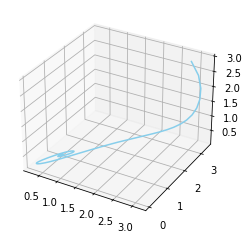

In [32]:
fig_1 = plt.figure()
ax = fig_1.add_subplot(111, projection = '3d')
ax.plot(laub_df_x1y1['x'], laub_df_x1y1['y'], laub_df_x1y1['z'], c='skyblue')

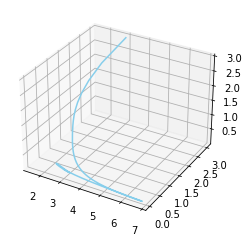

In [33]:
fig_1 = plt.figure()
ax = fig_1.add_subplot(111, projection = '3d')
ax.plot(laub_df_x1y1['w'], laub_df_x1y1['p'], laub_df_x1y1['q'], c='skyblue')

Plotting test data with different initial variables

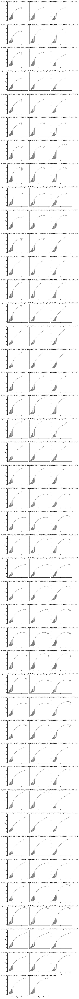

In [34]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "x", "y", color=".5", ci=None)
g.add_legend()

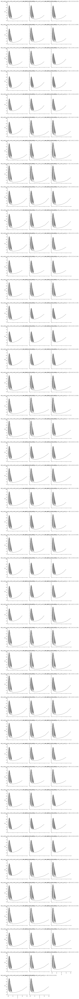

In [35]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "z", "w", color=".5", ci=None)
g.add_legend()

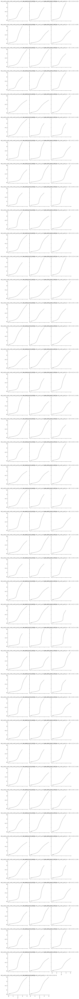

In [36]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "p", "q", color=".5", ci=None)
g.add_legend()

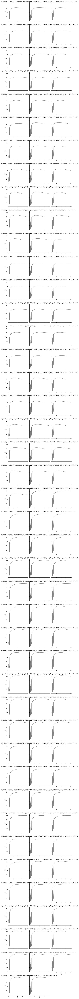

In [37]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "m", "x", color=".5", ci=None)
g.add_legend()

Plotting test data with different times series

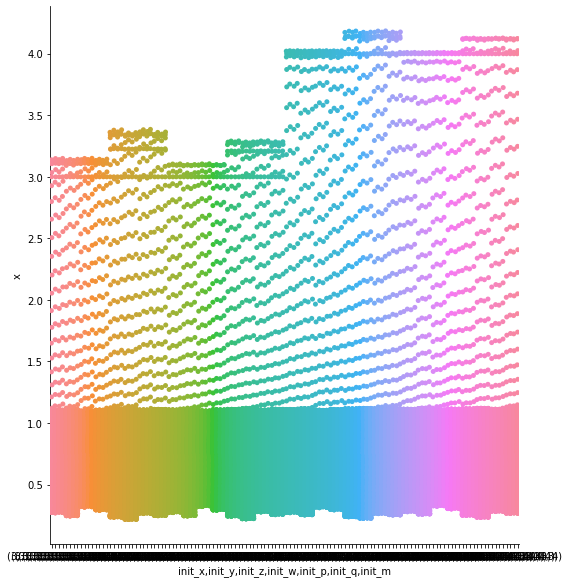

In [38]:
sns.catplot(height=8, data=laub_df_preds, x="init_x,init_y,init_z,init_w,init_p,init_q,init_m", y="x",)

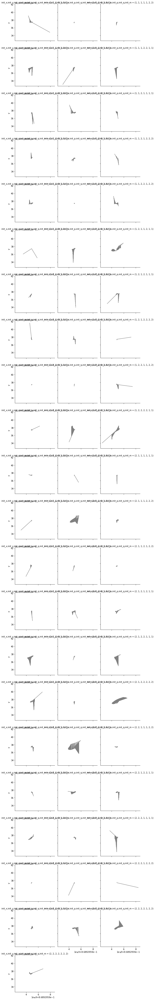

In [39]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "x", "y", color=".5", ci=None)
g.add_legend()

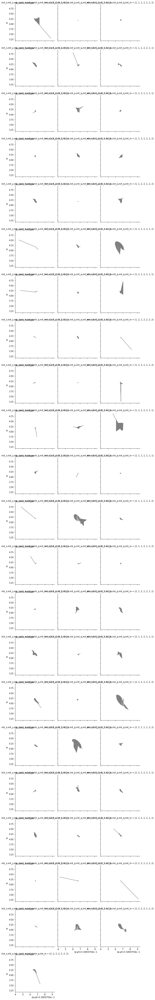

In [40]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "z", "w", color=".5", ci=None)
g.add_legend()

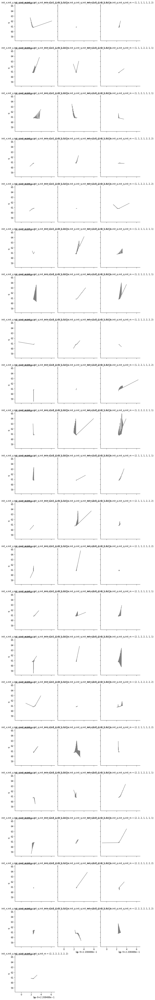

In [41]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "p", "q", color=".5", ci=None)
g.add_legend()

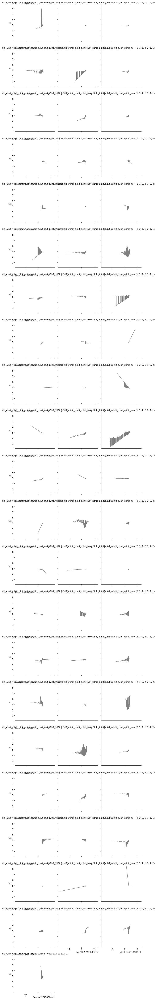

In [42]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "m", "x", color=".5", ci=None)
g.add_legend()

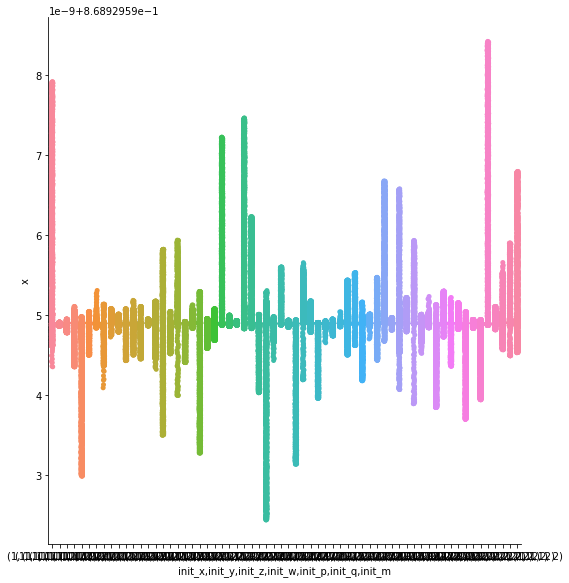

In [43]:
sns.catplot(height=8, data=laub_df_preds_1, x="init_x,init_y,init_z,init_w,init_p,init_q,init_m", y="x",)

### Predictions

Below we start first by visualising the predictions of simulations given by the neural network

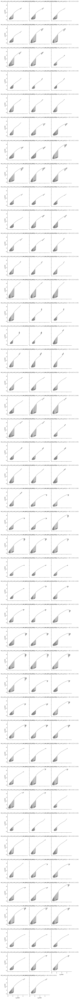

In [44]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "x_preds", "y_preds", color=".5", ci=None)
g.add_legend()

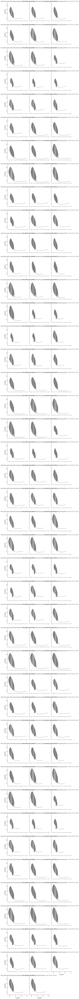

In [45]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "z_preds", "w_preds", color=".5", ci=None)
g.add_legend()

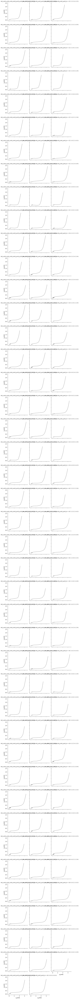

In [46]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "p_preds", "q_preds", color=".5", ci=None)
g.add_legend()

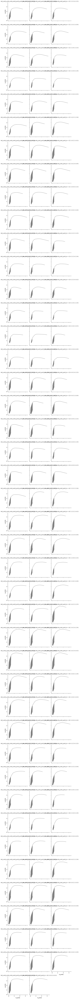

In [47]:
g = sns.FacetGrid(laub_df_preds, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "m_preds", "x_preds", color=".5", ci=None)
g.add_legend()

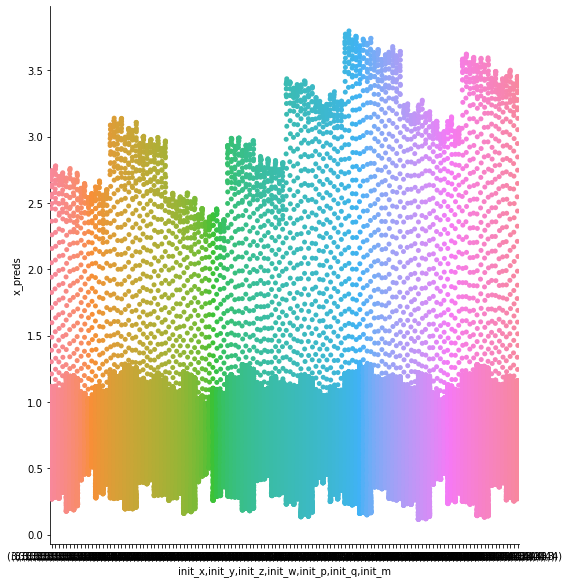

In [48]:
sns.catplot(height=8, data=laub_df_preds, x="init_x,init_y,init_z,init_w,init_p,init_q,init_m", y="x_preds",)

looking at predictions of test data with different time series

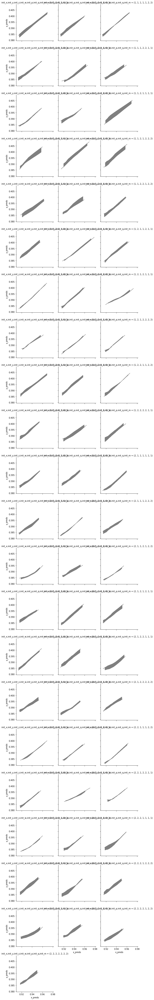

In [49]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "x_preds", "y_preds", color=".5", ci=None)
g.add_legend()

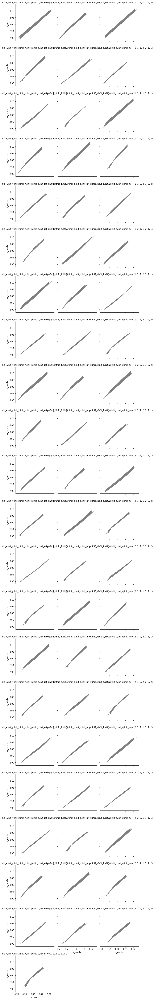

In [50]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "z_preds", "w_preds", color=".5", ci=None)
g.add_legend()

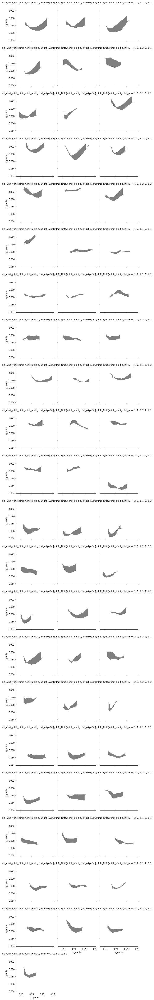

In [51]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "p_preds", "q_preds", color=".5", ci=None)
g.add_legend()

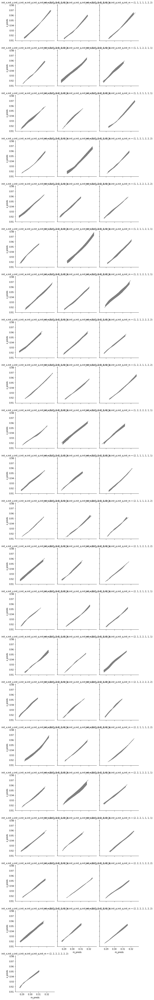

In [52]:
g = sns.FacetGrid(laub_df_preds_1, col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", col_wrap=3)
g.map(sns.lineplot, "m_preds", "x_preds", color=".5", ci=None)
g.add_legend()

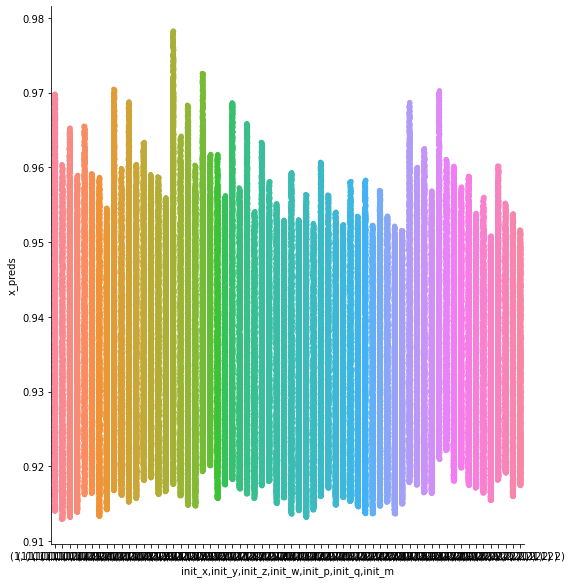

In [53]:
sns.catplot(height=8, data=laub_df_preds_1, x="init_x,init_y,init_z,init_w,init_p,init_q,init_m", y="x_preds",)

### Combining the data

comparing predictions and simulations of test data with different initial times

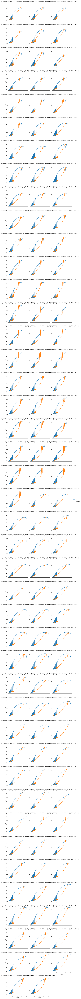

In [54]:
g = sns.FacetGrid(hue("x", laub_df_preds), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="x", col_wrap=3)
g.map(sns.lineplot, "xvals", "y", ci=None)
g.add_legend()

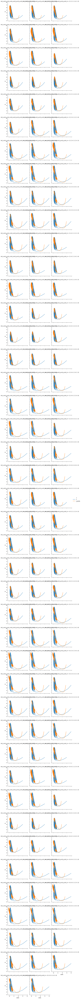

In [55]:
g = sns.FacetGrid(hue("z", laub_df_preds), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="z", col_wrap=3)
g.map(sns.lineplot, "zvals", "w", ci=None)
g.add_legend()

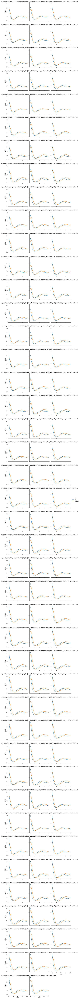

In [56]:
g = sns.FacetGrid(hue("x", laub_df_preds), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="x", col_wrap=3)
g.map(sns.lineplot, "time", "xvals", ci=None)
g.add_legend()

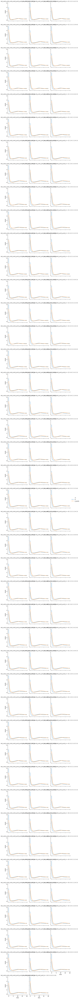

In [57]:
g = sns.FacetGrid(hue("m", laub_df_preds), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="m", col_wrap=3)
g.map(sns.lineplot, "time", "mvals", ci=None)
g.add_legend()

Comparing predictions and simulations with test data with different inital times

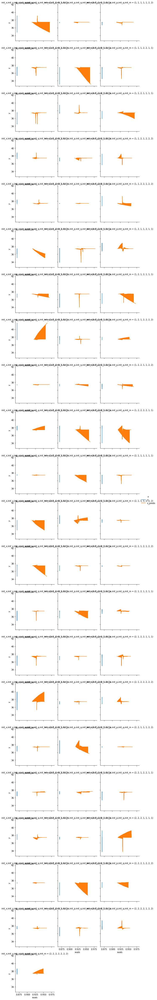

In [58]:
g = sns.FacetGrid(hue("x", laub_df_preds_1), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="x", col_wrap=3)
g.map(sns.lineplot, "xvals", "y", ci=None)
g.add_legend()

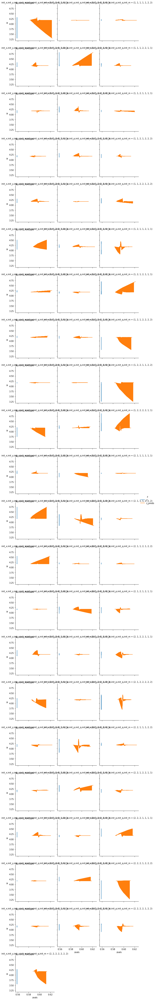

In [59]:
g = sns.FacetGrid(hue("z", laub_df_preds_1), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="z", col_wrap=3)
g.map(sns.lineplot, "zvals", "w", ci=None)
g.add_legend()

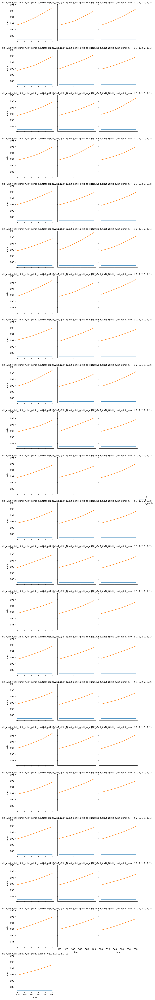

In [60]:
g = sns.FacetGrid(hue("x", laub_df_preds_1), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="x", col_wrap=3)
g.map(sns.lineplot, "time", "xvals", ci=None)
g.add_legend()

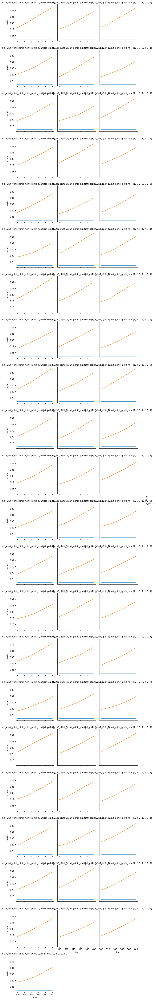

In [61]:
g = sns.FacetGrid(hue("m", laub_df_preds_1), col="init_x,init_y,init_z,init_w,init_p,init_q,init_m", hue="m", col_wrap=3)
g.map(sns.lineplot, "time", "mvals", ci=None)
g.add_legend()